# AirBNB Berlin

## Background Information 

Berlin is one of the most favourable city to visit in Europe. There are lot of tourist attractions , not only for adults, but also for children. AirBNB want therefore expanding business by targeting not only family segment, but also groups (each includes 3 people or more). Assuming that, family/group spend more than solo traveler, it is possibly good chance to bring company more capital. it is an excitement and real good opportunity as well to figure out more about it.

## Problem Statement

In order to optimizing business expansion process, it is bigger size of accommodation needed to fulfil long holiday school. At least places that can accommodate 3 persons or even more is to be investigated in order to expand this project. Entire House for Holiday Staycation are better and more suitable for modern family.

## Business Question

- In which areas are the most potential to be grown this business?
- Are these selected features affecting the accommodation price?
- Which type of room are most to be found in each neighbourhood group?
- Is the neighbourhood of the most expensive accommodation located in the same as its neighbourhood group (district) ?
- Does the sightseeing area have impact on the price?


## Business Goals

- Giving advices to our business development team to grow our business in favorable area hence with good and reasonable price.
- Building a model to predict accommodation price in best suitable district (neighbourhood group) for new accommodations.

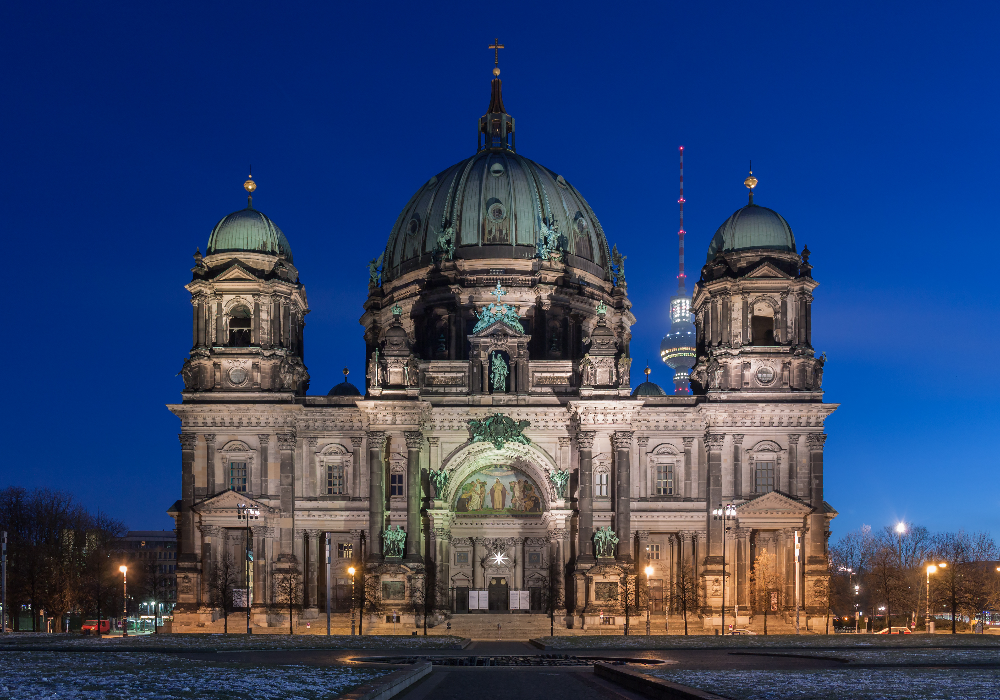

In [1]:
from IPython.display import Image
Image("M:/Purwadhika/Notizen Modul 3/Untitled Folder/Final Project/airBNB Berlin/Pict/berliner_dom.jpg")

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sidetable as stb
import webbrowser
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

from sklearn import set_config
set_config(print_changed_only=False)

In [3]:
df =pd.read_csv('final.csv')
df.head()

,Unnamed: 0,id,listing_url,name,description,picture_url,host_id,host_url,host_name,host_response_rate,...,accommodates,room_type,bedrooms,beds,price,minimum_nights,review_scores_rating,availability_365,instant_bookable,bathrooms
0,0,2015,https://www.airbnb.com/rooms/2015,Berlin-Mitte Value! Quiet courtyard/very central,Great location! <br />30 of 75 sq meters. Thi...,https://a0.muscache.com/pictures/260fd609-710a...,2217,https://www.airbnb.com/users/show/2217,Ion,100.0,...,3,Entire home/apt,1.0,0.0,61.14,5,93.0,180,f,1.0
1,1,3176,https://www.airbnb.com/rooms/3176,Fabulous Flat in great Location,This beautiful first floor apartment is situa...,https://a0.muscache.com/pictures/243355/84afcf...,3718,https://www.airbnb.com/users/show/3718,Britta,0.0,...,4,Entire home/apt,1.0,2.0,90.00,62,93.0,353,f,1.0
2,6,16644,https://www.airbnb.com/rooms/16644,In the Heart of Berlin - Kreuzberg,Light and sunny 2-Room-turn of the century-fla...,https://a0.muscache.com/pictures/73759174/e2ef...,64696,https://www.airbnb.com/users/show/64696,Rene,0.0,...,5,Entire home/apt,1.0,3.0,90.00,60,94.0,289,f,1.0
3,8,20858,https://www.airbnb.com/rooms/20858,Designer Loft in Berlin Mitte,Bright and sunny condo with two balconies in a...,https://a0.muscache.com/pictures/108232/205b19...,71331,https://www.airbnb.com/users/show/71331,Marc,100.0,...,4,Entire home/apt,2.0,2.0,159.00,3,89.0,175,f,1.0
4,9,21869,https://www.airbnb.com/rooms/21869,Studio in the Heart of Kreuzberg,Light and sunny 1-Room-turn of the century-fla...,https://a0.muscache.com/pictures/435605/4e86bb...,64696,https://www.airbnb.com/users/show/64696,Rene,0.0,...,4,Entire home/apt,1.0,2.0,70.00,60,95.0,291,f,1.0


## Removing Column Unnamed= 0

In [4]:
df.drop(columns=['Unnamed: 0'],inplace=True)

## Data Exploration

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3592 entries, 0 to 3591
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    3592 non-null   int64  
 1   listing_url           3592 non-null   object 
 2   name                  3592 non-null   object 
 3   description           3592 non-null   object 
 4   picture_url           3592 non-null   object 
 5   host_id               3592 non-null   int64  
 6   host_url              3592 non-null   object 
 7   host_name             3592 non-null   object 
 8   host_response_rate    3592 non-null   float64
 9   neighbourhood         3592 non-null   object 
 10  neighbourhood_group   3592 non-null   object 
 11  latitude              3592 non-null   float64
 12  longitude             3592 non-null   float64
 13  accommodates          3592 non-null   int64  
 14  room_type             3592 non-null   object 
 15  bedrooms             

In [6]:
df.isna().sum()

id                      0
listing_url             0
name                    0
description             0
picture_url             0
host_id                 0
host_url                0
host_name               0
host_response_rate      0
neighbourhood           0
neighbourhood_group     0
latitude                0
longitude               0
accommodates            0
room_type               0
bedrooms                0
beds                    0
price                   0
minimum_nights          0
review_scores_rating    0
availability_365        0
instant_bookable        0
bathrooms               0
dtype: int64

## Checking Q1, Q2, Q3, IQR, and Fences in price column

In [7]:
Q1 = df.describe()['price']['25%']
Q2 = df.describe()['price']['50%']
Q3 = df.describe()['price']['75%']
IQR = Q3 - Q1
Upper_Fence = Q3 + (1.5 * IQR)
Lower_Fence = Q1 - (1.5 * IQR)

print('Q1: ', Q1)
print('Q2: ', Q2)
print('Q3: ', Q3)

print('\nUpper Fence: ',Upper_Fence)
print('Lower Fence: ',Lower_Fence)

print('\nAverage price: ', round(df['price'].mean(),2))

Q1:  57.0
Q2:  82.0
Q3:  120.0

Upper Fence:  214.5
Lower Fence:  -37.5

Average price:  103.99


In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,3592.0,2.483903e+07,1.447248e+07,2015.00000,1.288522e+07,2.581042e+07,3.864126e+07,4.585497e+07
host_id,3592.0,9.533710e+07,1.093297e+08,2217.00000,6.815251e+06,4.388695e+07,1.678813e+08,3.714961e+08
host_response_rate,3592.0,7.680986e+01,3.812732e+01,0.00000,7.000000e+01,1.000000e+02,1.000000e+02,1.000000e+02
latitude,3592.0,5.251284e+01,3.367440e-02,52.34041,5.249412e+01,5.251467e+01,5.253426e+01,5.265598e+01
longitude,3592.0,1.340076e+01,7.217488e-02,13.09839,1.336283e+01,1.340647e+01,1.343431e+01,1.375057e+01
accommodates,3592.0,4.669822e+00,1.981564e+00,3.00000,3.000000e+00,4.000000e+00,5.000000e+00,1.600000e+01
bedrooms,3592.0,1.672049e+00,1.033237e+00,1.00000,1.000000e+00,1.000000e+00,2.000000e+00,3.200000e+01
beds,3592.0,2.856904e+00,2.762907e+00,0.00000,2.000000e+00,2.000000e+00,4.000000e+00,9.600000e+01
price,3592.0,1.039865e+02,9.868317e+01,11.00000,5.700000e+01,8.200000e+01,1.200000e+02,2.500000e+03
minimum_nights,3592.0,1.019432e+01,4.342821e+01,1.00000,1.000000e+00,2.000000e+00,4.000000e+00,1.124000e+03


In [9]:
df.describe(include='O')

,listing_url,name,description,picture_url,host_url,host_name,neighbourhood,neighbourhood_group,room_type,instant_bookable
count,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592
unique,3592,3527,3351,3499,2421,1443,129,12,4,2
top,https://www.airbnb.com/rooms/42810037,3 ROOM APARTMENT POTSDAMER PLATZ MITTE/KREUZBERG,-,https://a0.muscache.com/pictures/9c138a48-e8d8...,https://www.airbnb.com/users/show/1625771,Primeflats,Alexanderplatz,Mitte,Entire home/apt,f
freq,1,5,68,8,44,44,322,964,2927,1940


In [10]:
Wohnung=[]

for i in df.columns:
    Wohnung.append([
        i,
        df[i].dtypes,
        df[i].isna().sum(),
        (((df[i].isna().sum())/len(df))*100).round(2),
        df[i].nunique(),
        df[i].drop_duplicates().sample().values
    ])
    
pd.DataFrame(data=Wohnung,columns=[
    'Data Feature', 'Data Types', 'Null','Null Percentages','Unique','Unique Sample'
])


,Data Feature,Data Types,Null,Null Percentages,Unique,Unique Sample
0,id,int64,0,0.0,3592,[1297316]
1,listing_url,object,0,0.0,3592,[https://www.airbnb.com/rooms/16216285]
2,name,object,0,0.0,3527,[10 Minuten zum Checkpoint Charlie.]
3,description,object,0,0.0,3351,[Die brandneu sanierte ehemalige Fabrik Loft W...
4,picture_url,object,0,0.0,3499,[https://a0.muscache.com/pictures/dcc99315-45f...
5,host_id,int64,0,0.0,2421,[301803414]
6,host_url,object,0,0.0,2421,[https://www.airbnb.com/users/show/109236137]
7,host_name,object,0,0.0,1443,[Jan]
8,host_response_rate,float64,0,0.0,56,[0.0]
9,neighbourhood,object,0,0.0,129,[Oberschöneweide]


In [11]:
comp= round((3592/20227)*100,2)
print(f'Comparison between whole acommodations in Berlin to selected features is {comp} %.')

Comparison between whole acommodations in Berlin to selected features is 17.76 %.


## Checking outliers with a Box Plots

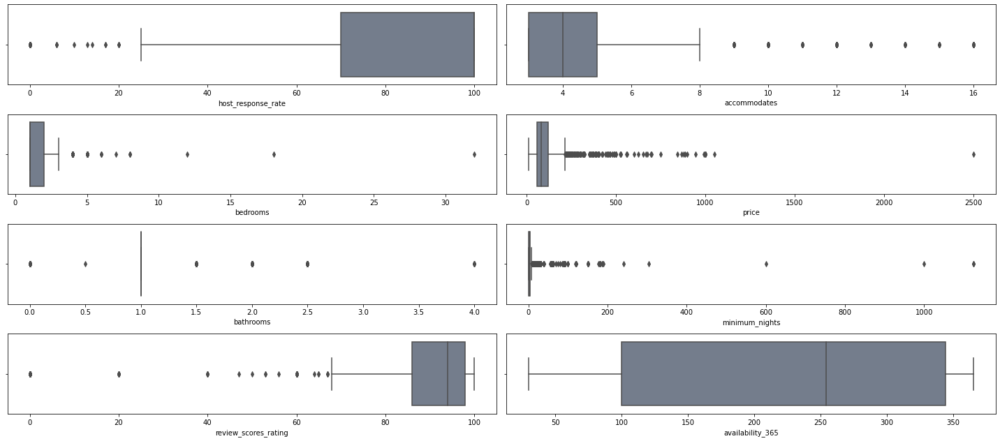

In [12]:
df1= df[['host_response_rate','accommodates','bedrooms','price','bathrooms','minimum_nights',
        'review_scores_rating','availability_365']]

plt.figure(figsize = (20, 15))
x = 1 

for column in df1.describe().columns:
    plt.subplot(7,2, x)
    sns.boxplot(df1[column],palette='bone')
    x+=1 

plt.tight_layout()
plt.show()

## EXPLORATORY DATA ANALYSIST

In [13]:
df.columns

Index(['id', 'listing_url', 'name', 'description', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_response_rate', 'neighbourhood',
       'neighbourhood_group', 'latitude', 'longitude', 'accommodates',
       'room_type', 'bedrooms', 'beds', 'price', 'minimum_nights',
       'review_scores_rating', 'availability_365', 'instant_bookable',
       'bathrooms'],
      dtype='object')

In [14]:
(df['bedrooms'].value_counts(normalize = True)*100).round(2)

# Half of the whole accommodations have 1 bedroom.

1.0     52.51
2.0     33.44
3.0     10.89
4.0      2.39
5.0      0.50
6.0      0.08
8.0      0.08
18.0     0.03
32.0     0.03
7.0      0.03
12.0     0.03
Name: bedrooms, dtype: float64

In [15]:
(df['neighbourhood'].value_counts(normalize = True)*100).round(2)

# Most Accommodations are found in Alexanderplatz Area.

Alexanderplatz                        8.96
Brunnenstr. Süd                       5.26
Frankfurter Allee Süd FK              4.48
Prenzlauer Berg Südwest               3.73
Tempelhofer Vorstadt                  3.62
                                      ... 
Gropiusstadt                          0.03
Malchow, Wartenberg und Falkenberg    0.03
Allende-Viertel                       0.03
Hellersdorf-Ost                       0.03
West 4                                0.03
Name: neighbourhood, Length: 129, dtype: float64

In [16]:
(df['neighbourhood_group'].value_counts(normalize = True)*100).round(2)

# Most Accommodations are found in District - Mitte.

Mitte                       26.84
Friedrichshain-Kreuzberg    18.71
Pankow                      17.26
Charlottenburg-Wilm.         9.88
Neukölln                     8.05
Tempelhof - Schöneberg       6.82
Treptow - Köpenick           3.93
Lichtenberg                  2.12
Steglitz - Zehlendorf        1.98
Spandau                      1.59
Reinickendorf                1.59
Marzahn - Hellersdorf        1.25
Name: neighbourhood_group, dtype: float64

In [17]:
(df['bathrooms'].value_counts(normalize = True)*100).round(2)

# More than half of the accommodations have at least 1 bathroom

1.0    65.01
0.0    16.23
2.0    10.44
1.5     6.43
2.5     1.70
4.0     0.17
0.5     0.03
Name: bathrooms, dtype: float64

- Half Bathroom (1/2 Bath) is a bathroom without the shower and the tub. This means in the case of the half bath there should be a room with a toilet and a sink (washing hands). Typically, half bathrooms are found on the ground floor of a house where there aren’t any bedrooms nearby. And the typical meaning of a half bath is one containing a toilet but no bathing facility.

- A full bath (1 bath) is a room that contain both a toilet and bathing facilities (a tub, shower, or both). And the typical meaning of a half bath is one containing a toilet but no bathing facility.

- A zero bathroom (0 bath) means there are no dedicated bathroom, however shared bathroom is provided by the host.

In [18]:
(df['instant_bookable'].value_counts(normalize = True)*100).round(2)

# Slightly more than half of the accommodations are not instant bookable.
# It means, most of the time guesses have to wait their confirmation from the hosts.

f    54.01
t    45.99
Name: instant_bookable, dtype: float64

In [19]:
(df['room_type'].value_counts(normalize = True)*100).round(2)

# The majority is entire home/apartment for room type.

Entire home/apt    81.49
Private room       14.45
Shared room         2.59
Hotel room          1.48
Name: room_type, dtype: float64

## Price Distribution

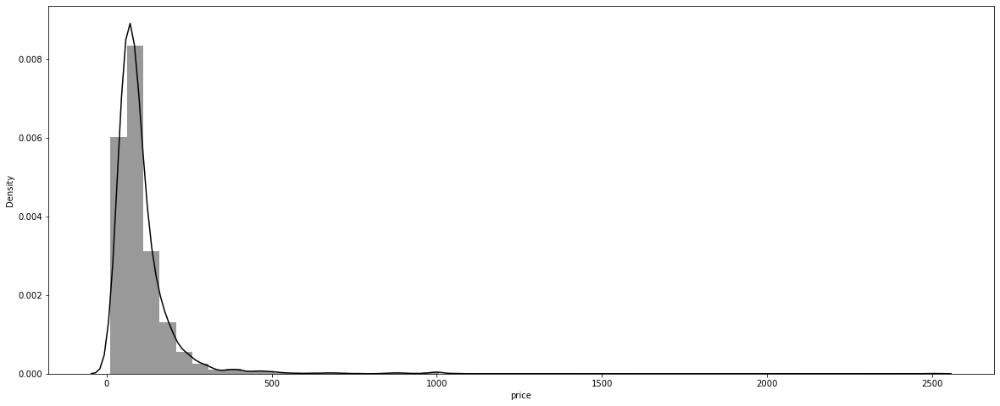

      price  count   percent
0     90.00    109  3.034521
1     80.00    108  3.006682
2     60.00    104  2.895323
3     65.00     89  2.477728
4    100.00     88  2.449889
..      ...    ...       ...
389   35.71      1  0.027840
390   35.29      1  0.027840
391   30.57      1  0.027840
392   27.86      1  0.027840
393   11.00      1  0.027840

[394 rows x 3 columns]


In [20]:
plt.figure(figsize = (20, 8))
sns.distplot(df['price'], color='black')
plt.show()

print(df.stb.freq(['price'], cum_cols = False))

In [21]:
print(df['price'].max())
print(df['price'].min())
df.loc[(df['price']==2500)|(df['price']==11)]

2500.0
11.0


,id,listing_url,name,description,picture_url,host_id,host_url,host_name,host_response_rate,neighbourhood,...,accommodates,room_type,bedrooms,beds,price,minimum_nights,review_scores_rating,availability_365,instant_bookable,bathrooms
373,2860420,https://www.airbnb.com/rooms/2860420,250 qm penthouse with roof terrace for photoshoot,"For rent for photoshoots, during week days, f...",https://a0.muscache.com/pictures/38610114/3821...,14623546,https://www.airbnb.com/users/show/14623546,Jean Luc,90.0,Tempelhofer Vorstadt,...,15,Entire home/apt,1.0,1.0,2500.0,1,100.0,89,f,2.0
2198,31817631,https://www.airbnb.com/rooms/31817631,cozy 10-bed-dorm,Very large room that can accommodate up to 10 ...,https://a0.muscache.com/pictures/04ff2592-91c3...,1391772,https://www.airbnb.com/users/show/1391772,Sunflower Hostel,99.0,Karl-Marx-Allee-Süd,...,10,Shared room,1.0,10.0,11.0,1,91.0,365,t,0.0


### The Most Expensive Accommodation

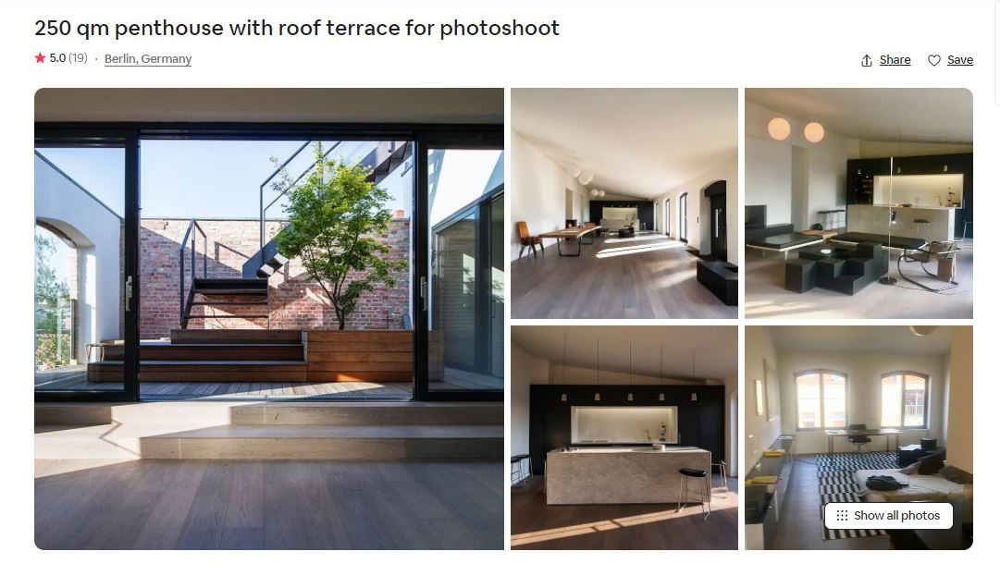

In [22]:
Image("M:/Purwadhika/Notizen Modul 3/Untitled Folder/Final Project/airBNB Berlin/Pict/teurste Wohnung.jpg")

#### About this space

- It is the really expensive, caused by its usage and multipurposes.

- Mostly rent for photoshoots, during week days, from 9 am to 7 pm, for a team of maximum 15 people :
Exceptional 250 sqm penthouse with rooftop and 360° view. The apartment has been designed to provide a unique experience of light and space. It has a patio, a balcony, and a rooftop terrasse overlooking the whole city.

## The cheapest Accommodation

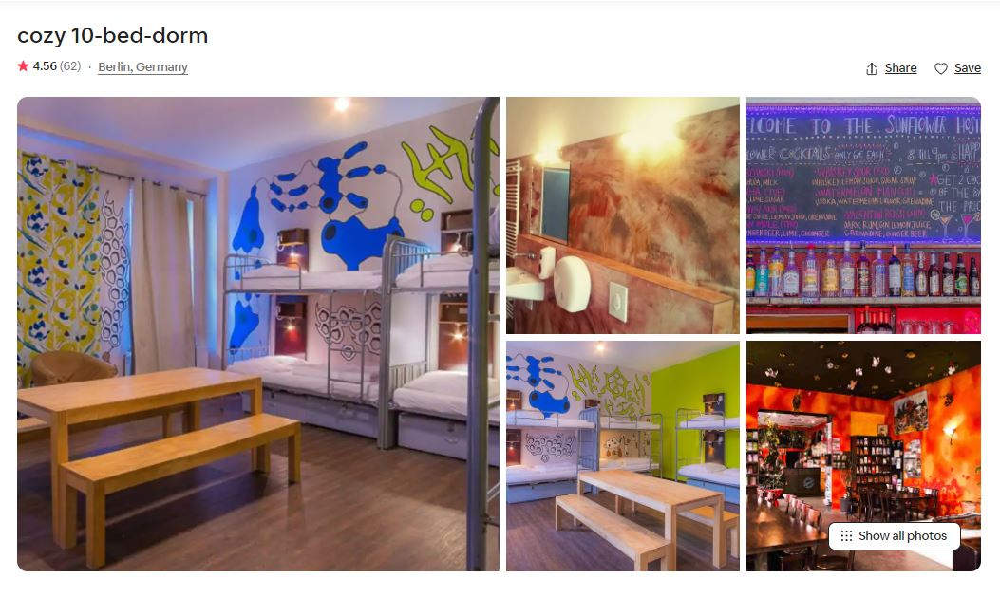

In [23]:
Image("M:/Purwadhika/Notizen Modul 3/Untitled Folder/Final Project/airBNB Berlin/Pict/Billigste Wohnung.jpg")

#### About this space

**Very large room that can accommodate up to 10 people (mixed) place offers.
It can be booked one to ten beds in that room. If guess book only one bed the other beds will be available for nine more guests.**

**It has 5 bunks and lends itself very well for a small group.
The spacious bathroom is for multiple rooms.**

The space
Sunflower Hostel is characterized by its colorful and unconventional design, and offers plenty of space to meet and to exchange with other travelers.
For this purpose especially the lobby invites with a bar, table football, plenty of seating and even a small pond with fishes!

Guest access
In addition to bedding and free towels, there are washers, dryers, TV and also free Wi-Fi available in the common room.

## Checking the correlations between Price and several features

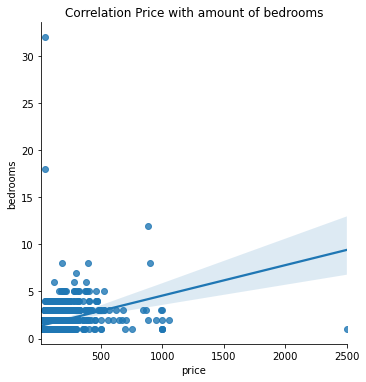

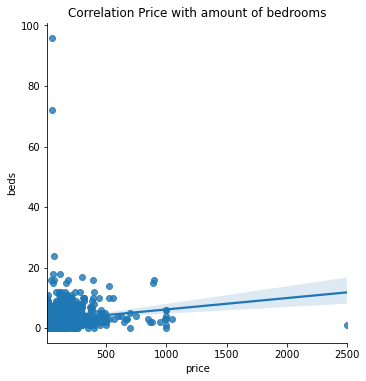

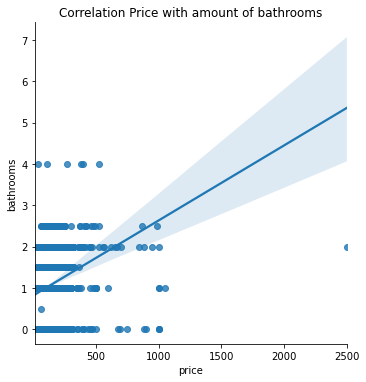

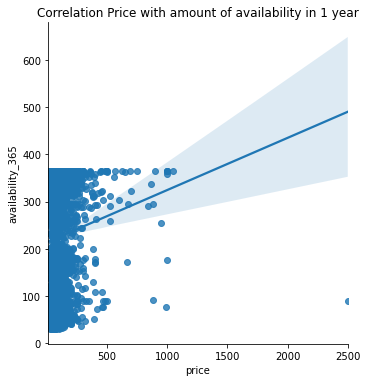

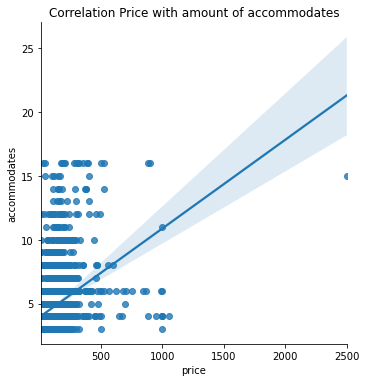

In [24]:
sns.lmplot(x = 'price', y = 'bedrooms', data=df)
plt.title('Correlation Price with amount of bedrooms')
plt.show()

sns.lmplot(x = 'price', y = 'beds', data=df)
plt.title('Correlation Price with amount of bedrooms')
plt.show()

sns.lmplot(x = 'price', y = 'bathrooms', data=df)
plt.title('Correlation Price with amount of bathrooms')
plt.show()

sns.lmplot(x = 'price', y = 'availability_365', data=df)
plt.title('Correlation Price with amount of availability in 1 year')
plt.show()

sns.lmplot(x = 'price', y = 'accommodates', data=df)
plt.title('Correlation Price with amount of accommodates')
plt.show()

## Distribution of neighbourhood group

Mitte                       964
Friedrichshain-Kreuzberg    672
Pankow                      620
Charlottenburg-Wilm.        355
Neukölln                    289
Tempelhof - Schöneberg      245
Treptow - Köpenick          141
Lichtenberg                  76
Steglitz - Zehlendorf        71
Spandau                      57
Reinickendorf                57
Marzahn - Hellersdorf        45
Name: neighbourhood_group, dtype: int64


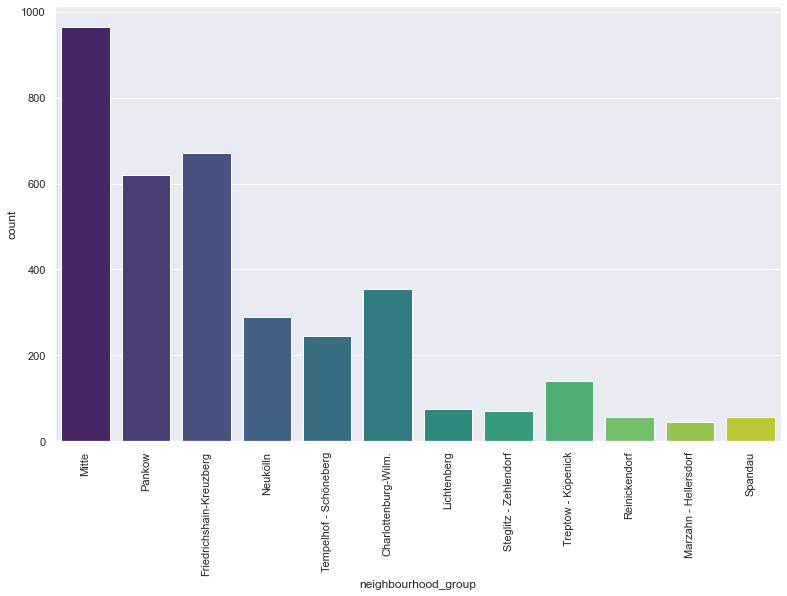

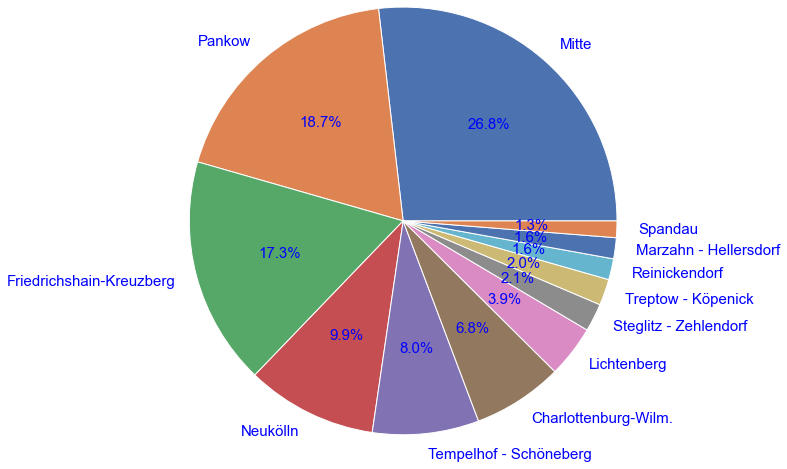

In [44]:
print(df.neighbourhood_group.value_counts())

plt.figure(figsize = (13, 8))
sns.countplot(df['neighbourhood_group'],palette='viridis')
plt.xticks(rotation=90)
plt.show()

persentase = df.neighbourhood_group.value_counts().values
nama = ['Mitte', 'Pankow', 'Friedrichshain-Kreuzberg', 'Neukölln',
       'Tempelhof - Schöneberg', 'Charlottenburg-Wilm.', 'Lichtenberg',
       'Steglitz - Zehlendorf', 'Treptow - Köpenick', 'Reinickendorf',
       'Marzahn - Hellersdorf', 'Spandau']
plt.pie(persentase, labels=nama,
        startangle=0,
        textprops = {
            'size' : 15,
            'color' : 'blue'
        },
        autopct = '%1.1f%%',
       radius = 1.405)
plt.show()

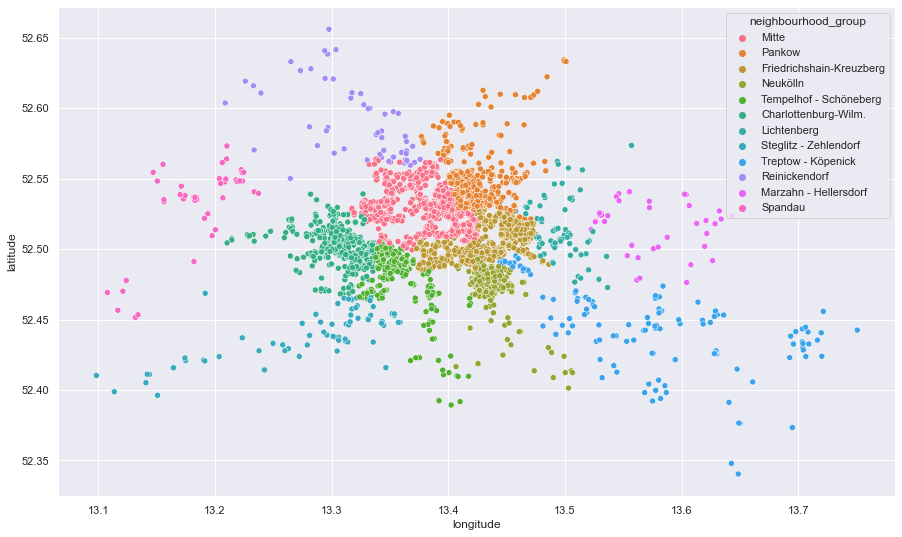

In [45]:
plt.figure(figsize=(15,9))
sns.scatterplot(df.longitude,df.latitude,hue=df.neighbourhood_group)
plt.ioff()

### Average Price per Neighbourhood Group

### Average Price per Neighbourhood

                          count   mean   min     max
neighbourhood_group                                 
Charlottenburg-Wilm.      355.0  101.9  20.0   650.0
Friedrichshain-Kreuzberg  672.0   99.7  11.0  2500.0
Lichtenberg                76.0   90.9  20.0   667.0
Marzahn - Hellersdorf      45.0   89.5  19.0   420.0
Mitte                     964.0  116.3  12.0  1050.0
Neukölln                  289.0   89.7  21.0   500.0
Pankow                    620.0  105.9  20.0   990.0
Reinickendorf              57.0   84.0  24.0   880.0
Spandau                    57.0   87.7  26.0   350.0
Steglitz - Zehlendorf      71.0  102.5  30.0   465.0
Tempelhof - Schöneberg    245.0   98.7  20.0   885.0
Treptow - Köpenick        141.0  102.3  13.0   480.0




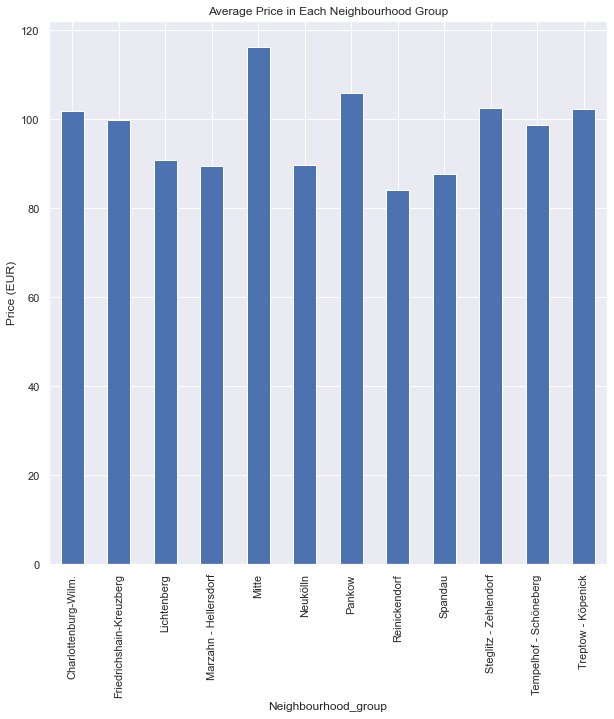

In [26]:
avg_price_per_nh_group = df.groupby(by=df['neighbourhood_group'])['price'].describe().round(1)
y = pd.DataFrame([avg_price_per_nh_group['count'],avg_price_per_nh_group['mean'], avg_price_per_nh_group['min'], avg_price_per_nh_group['max']]).T
print(f'{y}\n\n')

sns.set(rc={'figure.figsize':(10,10)})
bar_avg_price_per_nh_group = y['mean'].plot(kind='bar')
bar_avg_price_per_nh_group.set_title('Average Price in Each Neighbourhood Group')
bar_avg_price_per_nh_group.set_xlabel('Neighbourhood_group')
bar_avg_price_per_nh_group.set_ylabel('Price (EUR)')
plt.show()

## Room Type Distribution

Entire home/apt    2927
Private room        519
Shared room          93
Hotel room           53
Name: room_type, dtype: int64




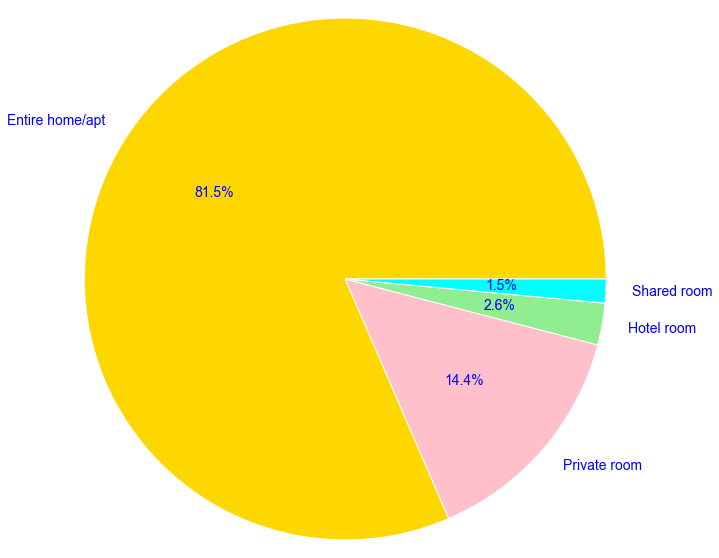

In [27]:
x=df['room_type'].value_counts()
print(f'{x}\n\n')
persentase = df.room_type.value_counts().values
nama = ['Entire home/apt','Private room','Hotel room','Shared room']
plt.pie(persentase, labels=nama,
        colors= ['gold','pink','lightgreen','cyan'],
        startangle=0,
        textprops = {
            'size' : 14,
            'color' : 'blue'
        },
        autopct = '%1.1f%%',
       radius = 1.2)
plt.show()

## Average Price each Room Type

room_type
Hotel room         141.862642
Entire home/apt    110.701862
Private room        74.445434
Shared room         35.907097
Name: price, dtype: float64


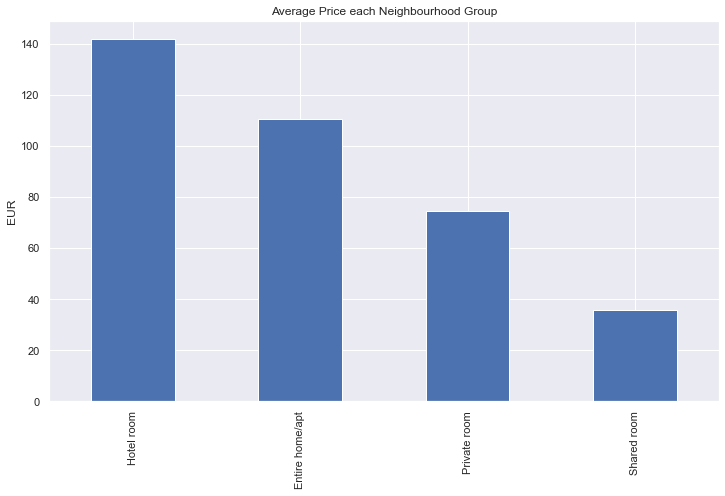

In [28]:
AVRP=df.groupby('room_type')['price'].mean().sort_values(ascending=False)
print(AVRP)

sns.set(rc={'figure.figsize':(12,7)})
bar_rata_rata_occupancy = AVRP.plot(kind='bar')
bar_rata_rata_occupancy.set_title('Average Price each Neighbourhood Group')
bar_rata_rata_occupancy.set_xlabel('')
bar_rata_rata_occupancy.set_ylabel('EUR')
plt.show()

room_type                 Entire home/apt  Hotel room  Private room  \
neighbourhood_group                                                   
Charlottenburg-Wilm.                105.1       206.7          80.6   
Friedrichshain-Kreuzberg            108.0        87.8          70.2   
Lichtenberg                         102.2        93.0          63.1   
Marzahn - Hellersdorf               102.7       190.0          60.1   
Mitte                               124.7       146.4         100.1   
Neukölln                             96.7         NaN          64.8   
Pankow                              110.4       159.0          68.6   
Reinickendorf                        92.4         NaN          48.7   
Spandau                              88.3       252.0          48.5   
Steglitz - Zehlendorf               110.3        40.0          57.9   
Tempelhof - Schöneberg              103.5       139.4          59.8   
Treptow - Köpenick                  108.5         NaN          64.2   

room_

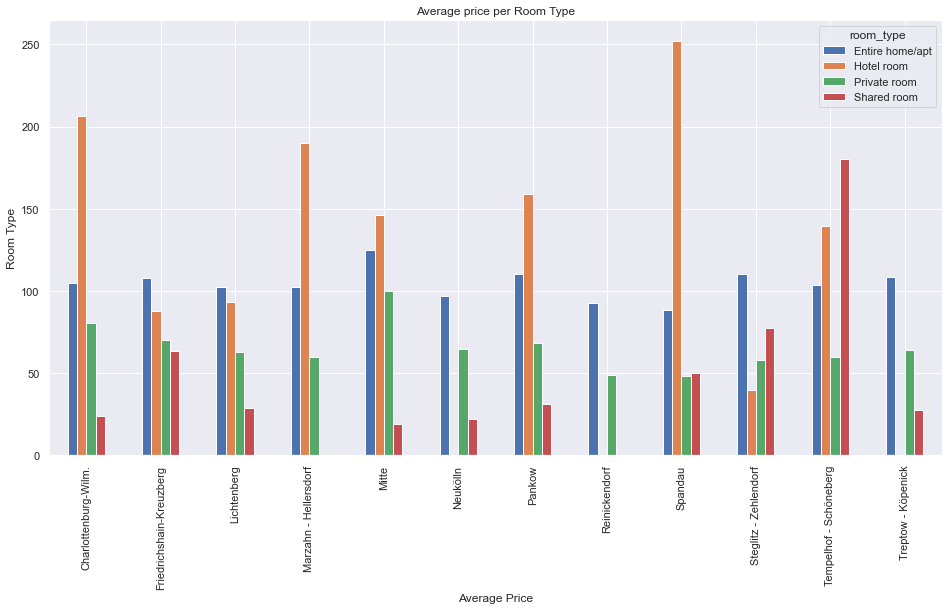

In [29]:
Room_type_mean = pd.crosstab(index=df['neighbourhood_group'], columns=df['room_type'], values=df['price'], 
                             aggfunc='mean').round(1)
print(Room_type_mean)

sns.set(rc={'figure.figsize':(16,8)})
Room_type_mean_bar = Room_type_mean.plot(kind='bar')
Room_type_mean_bar.set_title('Average price per Room Type')
Room_type_mean_bar.set_xlabel('Average Price')
Room_type_mean_bar.set_ylabel('Room Type')
plt.show()

## Top 10 Most expensive neighbourhood 

neighbourhood            neighbourhood_group   
Allende-Viertel          Treptow - Köpenick        456.0
West 1                   Reinickendorf             328.0
Rummelsburger Bucht      Lichtenberg               250.2
Haselhorst               Spandau                   201.0
Köpenick-Süd             Treptow - Köpenick        158.2
Weißensee Ost            Pankow                    151.0
Brunnenstr. Nord         Mitte                     148.2
Zehlendorf  Nord         Steglitz - Zehlendorf     147.0
Prenzlauer Berg Südwest  Pankow                    140.9
Tempelhof                Tempelhof - Schöneberg    139.4
Name: price, dtype: float64




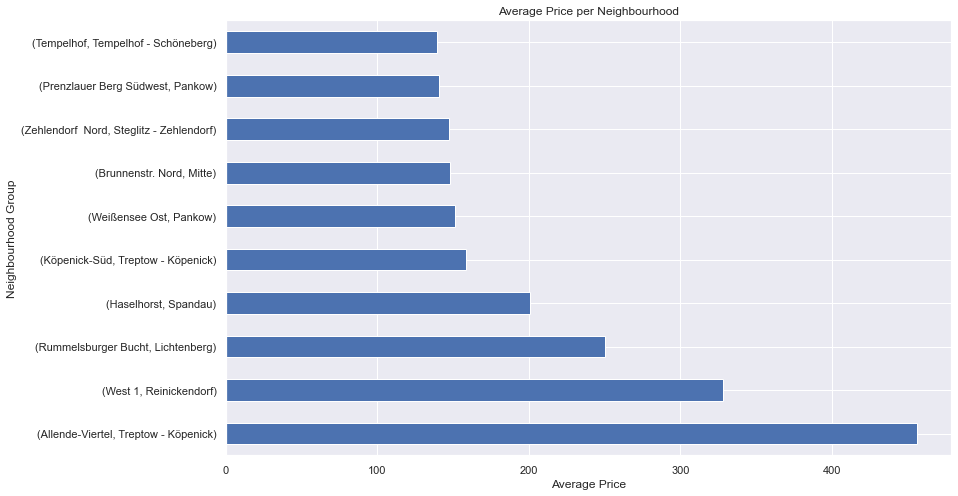

In [30]:
Neighborhood_avg_price = df.groupby(by=[df['neighbourhood'], df['neighbourhood_group']])['price'].mean().round(1)
Neighborhood_avg_price_top_ten=(Neighborhood_avg_price.sort_values(ascending=False).head(10))
print(f'{Neighborhood_avg_price_top_ten}\n\n')

plt.figure(figsize = (13, 8))
sns.set(rc={'figure.figsize':(15,7)})
Neighborhood_avg_price_top_ten_bar = Neighborhood_avg_price_top_ten.plot(kind='barh')
Neighborhood_avg_price_top_ten_bar.set_title('Average Price per Neighbourhood')
Neighborhood_avg_price_top_ten_bar.set_xlabel('Average Price')
Neighborhood_avg_price_top_ten_bar.set_ylabel('Neighbourhood Group')
plt.show()

In [31]:
df.loc[(df['neighbourhood']=='Allende-Viertel')]

,id,listing_url,name,description,picture_url,host_id,host_url,host_name,host_response_rate,neighbourhood,...,accommodates,room_type,bedrooms,beds,price,minimum_nights,review_scores_rating,availability_365,instant_bookable,bathrooms
2228,32120251,https://www.airbnb.com/rooms/32120251,Ferienhaus für max. Personen,"I´am speaking english. I hope it,s enough for ...",https://a0.muscache.com/pictures/582d2de6-80b0...,192092454,https://www.airbnb.com/users/show/192092454,Ulf,0.0,Allende-Viertel,...,7,Entire home/apt,4.0,6.0,456.0,4,100.0,109,t,2.0


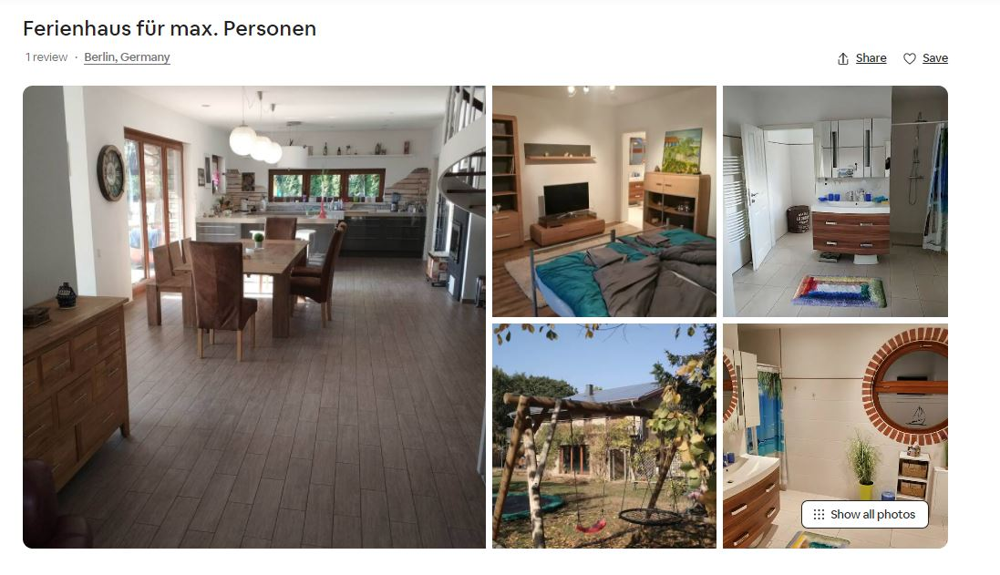

In [32]:
Image("M:/Purwadhika/Notizen Modul 3/Untitled Folder/Final Project/airBNB Berlin/Pict/wohnung teuer.jpg")

**Guess have access to its entire house and to all amenities. There is kitchen, bedrooms, terrasse, outdoor, etc. This accommodation can accommodate 7 guests and has 4 bedrooms, 6 beds, and 2 baths.**

## Summary 

-	Most of the accommodations are in Alexanderplatz Area (by almost 9%). This area is located in Berlin Mitte, which also become the most favorable are for accommodations rent.

    - Berlin Mitte has the highest number as the most favorable area by almost 27% with 964 units. Then come Friedrichshain – Kreuzberg with 672 units (by 18.71%), Pankow with 620 units (17.26%), and Charlottenburg – Wilmersdorf with 355 units (almost 10%).
    
    - The most expensive accommodation is located in Tempelhof – Schoeneberg area with 2500 USD per night. Caused by its condition, usage, and multipurposeness. Mostly rent for photoshoots, during week days, from 9 am to 7 pm, for a team of maximum 15 people. Exceptional 250 sqm penthouse with rooftop and 360° view. The apartment has been designed to provide a unique experience of light and space. It has a patio, a balcony, and a rooftop terrace overlooking the whole city.
    
    - On the other hand, the accommodation with lowest price is a hostel in Berlin Mitte with 11 USD per night. This hostel has 5 bunks and can accommodate for maximal 10 persons in 1 bedroom.
    
    - According to the distribution map. It is clearly to observe, most of our accommodations are located in the center of Berlin, where there are lots of sightseeing and tourist attractions. 
    
    
- The Majority of the accommodations has at least 1 bathroom. This is explained:

    - Half Bathroom (1/2 Bath) is a bathroom without the shower and the tub. This means in the case of the half bath there should be a room with a toilet and a sink (washing hands). Typically, half bathrooms are found on the ground floor of a house where there aren’t any bedrooms nearby. And the typical meaning of a half bath is one containing a toilet but no bathing facility.
    - A full bath (1 bath) is a room that contain both a toilet and bathing facilities (a tub, shower, or both). And the typical meaning of a half bath is one containing a toilet but no bathing facility.
    - A zero bathroom (0 bath) means there are no dedicated bathroom, however shared bathroom is provided by the host.


-	Most of the accommodations are having just 1 bedroom by 52%, 2 and 3 bedrooms come afterwards by 33% and 10.89% respectively.
-	Slightly more than a half of the whole accommodations are not instant bookable. This means guesses have to wait approval from their host, if they want to book their places. Meanwhile on the other hand, the guesses do not need approval and can just register according the check-in time.
- The majority of price is distributed between 60 USD - 100 USD.
-	It is clear to see that entire home/apt are the most favorable room type to stay for group or family during long stay holiday. It is also to see entire home/apt is dominating the percentage by almost 82%, followed by private room (14%), shared room (2.6%), and hotel room (1.5%). However, even there is only few hotel rooms for this particular category, hotel rooms has the highest average price per night among other room type with 141 USD, Entire home/apt are following with 110 USD.

## Conclusion 

Berlin is by far one of the most free-spirited, diverse and exciting cities in Europe and It is totally recommended to anyone who wants to have a taste of the complex history of Germany. Berlin is also one of the only cities  that has a couple of city centers to stay in (due to the Berlin Wall that was dividing the city for decades).

- **Mitte** is the area where all the most famous Berlin attractions are located: Alexanderplatz, Brandenburg Gate, Museum Island etc. Even though the neighborhood has suffered through many transformations during the years, it is still to see that some traces of the old times if you just roam around the streets and observe the buildings and details. Needless to say that because it is so central and popular, Mitte can be expensive at times.


- **Prenzlauer Berg in Pankow District** has a complicated history full of changes. In the 80s and 90s it was massively changed transformed by the subculture that was forming there, thanks to many artists of that time. Now visitors can stroll around the beautiful streets, stop in a hip café to enjoy a flat white and then continue on to visit some art galleries or even designer shops. It also to admire the street art and street musicians that people will encounter on every corner.
    - One of the most special things about this neighborhood is that many of the buildings (old breweries and old factory buildings, for example) were transformed into hotels and sophisticated restaurants, so visitors can definitely have a unique experience there.
    - Being one of the most popular neighborhoods in Berlin and one that is very loved by young urban families and individuals as well, the rooms sell out fast all year round, so it is clearly a good opportunity to renovate and rent your place.
    
    
- Friedrichshain-Kreuzberg
    - **Kreuzberg**. For all the travelers who prefer partying, night clubs and dancing, my recommendation for the best area to stay in Berlin is Kreuzberg! This area, also known as “Xberg”, boasts clubs, hipster restaurants, and beautiful street art. If you decide to expand our business area here, this a really good opportunity, because visitors can absolutely try as many restaurants as they can as there are many ethnic communities living here, each of them with their own amazing cuisine, so you will get to taste the real deal. Here people can stay locally and it is really good for long stay visitors.
    - **Friedrichshain**. LOcated in the same area as Kreuzberg, Friedrichshain have lot similarities. Friedrichshain is one of the coolest places in Berlin and another party hub in the city, this time recommended especially for budget travelers who want to be in the center of the action. This amazing neighborhood is a mix of old and new, calm and energy, and the perfect place to meet very diverse people who like to dance and make friends. Warschauer Strasse is right in the center of this neighborhood and it is surrounded by both cool bars and old buildings. You will also find here the East Side Gallery here, an open-air gallery created right on the biggest piece of what once was the Great Berlin Wall.
    
    
- **Neukoelln** is a great place for the visitor who do not want stay in the center of the city, however, this place still have an autentic experience in Berlin. Neukölln, also known as “Little Istanbul” is very popular among young people and one of the best neighborhoods in Berlin if you don’t want to be exactly in the center. It got its nickname due to the large number of Turkish people who live there and, of course, the amazing Turkish bars can be found on each street. If you’re ever in this neighborhood, make sure to enjoy a coffee or a beer by the canal at Westerstrasse or at Maybachufer and enjoy the view and relaxed atmosphere. It is also to found many art galleries, bars and funky restaurants here, perfect to end the day with an unforgettable meal or drink. At night there are many parties and clubs where people can go to feel the real spirit of Berlin.


- **Charlottenburg-Wilmersdorf** is one of the best choices for a family that wants to explore Berlin with kids. It is recommended expanding the business by targeting family with kids/children. Besides being full of child-friendly and family-friendly hotels, this is one of the most luxurious areas of Berlin as well, with many great restaurants around Savignyplatz. Some beautiful places to visit in this neighborhood are Charlottenburg Palace (the attraction for which this neighborhood is named), Lake Lietzensee and, of course, Kurfürstendamm – the famous shopping street in Berlin full of luxury and high-end designer stores.

## Recommendation

According to the data and further investigation about the business and geographical location,Steglitz - Zehlendorf and Treptow - Kopernick are 2 most recommended area recommended to be further explored. 

**1. Treptow - Kopernick**

    - This area has the largest area of forest in Berlin. It also has rivers, lakes, and beautiful parks and the oldtown of KOPERNICK. This area also offers a FEZ (Center for children, youth, and family). According to our category, it is really suitable for family with kids and children. 
    - It is also offers a lot for sport-activities, with perfect conditions for windsurfing, Swimming, sailing, joggin, and also cycling.
    - Nevertheless, it is also the nearest location to the newest Berlin INternational Airport "Schoenefeld".
    - According to its area,where the nature offers in compare to what city center have, entire home/ apt could be the room type, we are looking for with lots of bedroom to accommodate more people with reasonable price around average price in that area depends on the places's condition.
    
    
**2. Steglitz - Zehlendorf**

    - Steglitz-Zehlendorf is renowned for its woodlands and lakes. The spreading Grunewald forest, shared between the Zehlendorf and Wilmersdorf districts, covers nearly 7500 acres! The forest is one of Berlin’s best-loved green spaces for sports and recreation. Ideal for walking and cycling, this woodland is also home to the romantic Grunewald hunting lodge as well as the Brücke Museum with its stunning collection of works by German Expressionist artists.
    - For most locals and visitors, Steglitz means the major shopping street of Schlossstraße, with its malls, flagship stores, and large and small outlets. 
    - To the south, the green forest meets the blue waters of the district’s lakes. With Wannsee, Krumme Lanke and Schlachtensee lakes, Zehlendorf boasts three popular bathing lakes where (nearly) all the locals meet in summer. 
    - So, it is really recommended expanding business in this area, regarding to its different facet in compare to what the majority districts in center of Berlin could offer.  According to data, price can be set around  the average price in this area, but still lower than the average price for district in city center.
